# Introduction

***Часові ряди*** – це найпоширеніші дані для роботи. Їх основна відмінність від будь-якого іншого типу даних полягає в їх залежності від часу. Період зміни даних може бути будь-яким: секундами, хвилинами, днями тощо.

Як виглядає звичайний набір даних із часовими рядами:

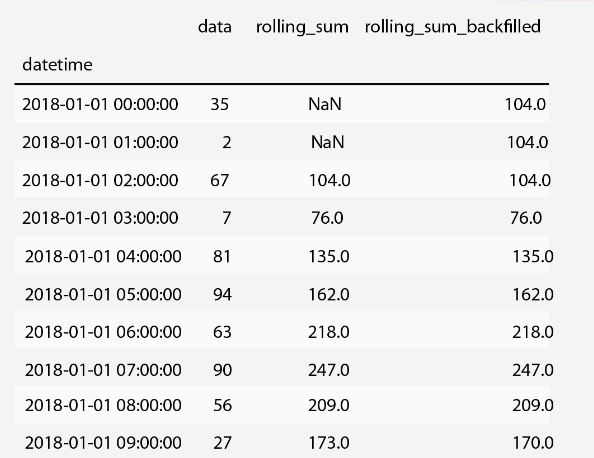

Як бачите, основна відмінність такого набору даних від інших полягає в наявності стовпця datetime, що відповідає за індикатор часу. У прикладі зразок записувався в набір даних рівно щогодини.

Часові ряди мають багато показників, які ми повинні аналізувати: сезонність, циклічність, тенденції, стаціонарність тощо.

На основі цих показників можна моделювати поведінку часових рядів і прогнозувати їх розвиток.

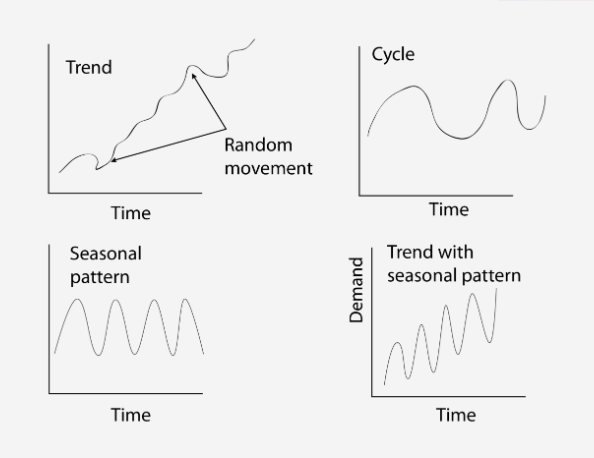

# Practical Examples

Медицина, онлайн-бізнес, освіта – кожна з цих сфер наповнена безліччю часових рядів, для яких ми можемо розробити статистичні моделі та почати прогнозувати. Які реальні проблеми ми можемо вирішити?

Припустимо, у вас є інтернет-магазин. Відразу стає зрозуміло, що можна передбачити чистий прибуток, який приносять продажі. Ми маємо можливість передбачити індивідуальну поведінку постійних клієнтів і передбачити, скільки покупок вони можуть зробити в поточному і наступному місяці.

Крім того, ми можемо зосередитися на процесах, які відбуваються у великих компаніях, і, наприклад, прогнозувати плинність кадрів.

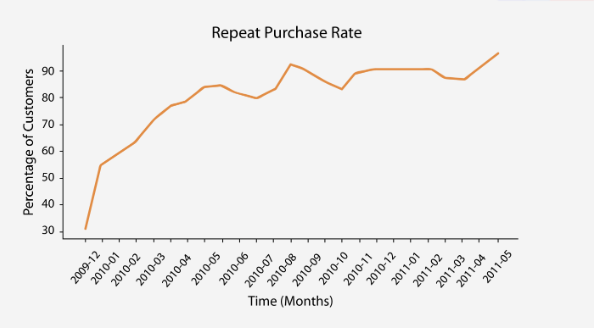

У медичній сфері - у вас є можливість створювати моделі для прогнозування кількості звернень до відділення невідкладної допомоги, розвитку ЕЕГ людини під час фізичних вправ, ранньої діагностики тощо.

Якщо у вашій компанії є якісь дані, які змінюються з часом, існує висока ймовірність того, що, зібравши набір даних, ви зможете знайти проблему, яку вам дозволять вирішити математичні моделі для часових рядів.

# Model Types

Ознайомимося з деякими найпоширенішими моделями прогнозування часових рядів:

*Проста ковзаюча середня.* Ця модель часто використовується для наборів даних, які не мають сезонності або яскраво виражених трендів (такий тип даних називається стаціонарними даними). У цій моделі ми створюємо прогнози на основі середнього значення попередніх точок даних.

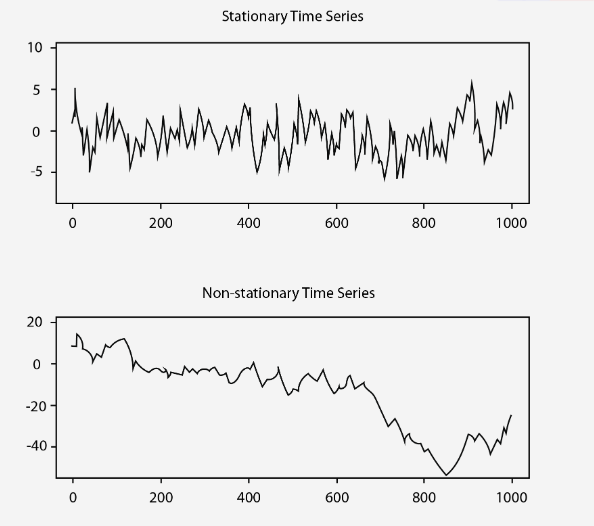

*Авторегресійна модель*. Модель заснована на принципі лінійної регресії з додаванням залежної змінної, лінійної функції минулих значень залежної змінної. Цю модель можна використовувати тільки для стаціонарних даних;

*Модель ковзного середнього* – ця модель також працює як лінійна регресія, але замість того, щоб використовувати попередні значення як предиктори, ця модель робить прогнози, використовуючи лінійну комбінацію зразків, створених у процесі білого шуму. Важливо визнати, що ковзне середнє та просте ковзне середнє — дві різні моделі. Ця модель також може бути використана тільки для стаціонарних даних;

*Авторегресійна інтегрована модель ковзного середнього*. Як випливає з назви, ця модель поєднує в собі дві попередні з додатковою диференціальною сходинкою. Яку перевагу це може дати? Наприклад, здатність представляти часовий ряд з нестаціонарними властивостями;

*Векторна авторегресійна модель.* Головною особливістю цієї моделі є можливість прогнозування багатовимірних часових рядів.

# Implementation in Python

Ознайомившись з моделями, які дозволять прогнозувати часові ряди, у вас, мабуть, виникло питання, які бібліотеки Python будуть використовуватися?

По-перше, щоб краще зрозуміти математичний механізм - ви можете реалізувати одну з моделей самостійно на Python.

Тоді як ми будемо завантажувати решту моделей через такі бібліотеки, як statsmodels:

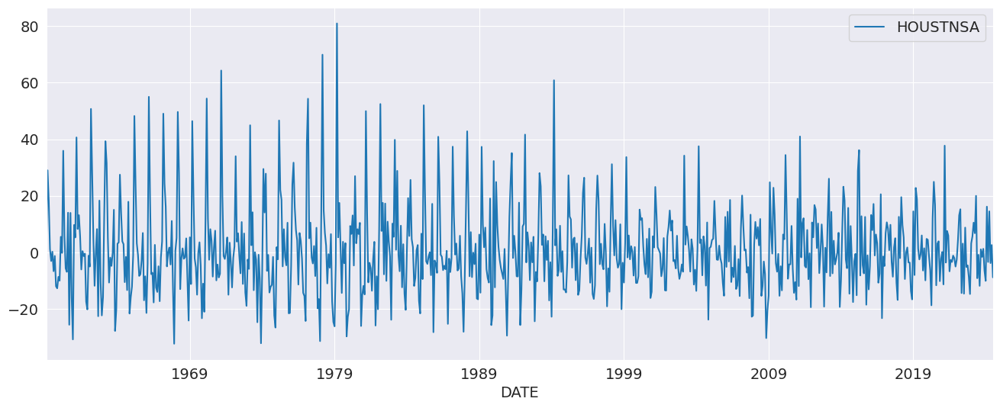

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from statsmodels.tsa.api import acf, graphics, pacf
from statsmodels.tsa.ar_model import AutoReg, ar_select_order

sns.set_style("darkgrid")
pd.plotting.register_matplotlib_converters()
plt.rc("figure", figsize=(16, 6))
plt.rc("font", size=14)

data = pd.read_csv("/content/HOUSTNSA.csv")
data['DATE'] = pd.to_datetime(data['DATE'])
data = data.set_index("DATE")
housing = data.pct_change().dropna()
housing = 100 * housing.asfreq("MS")
fig, ax = plt.subplots()
ax = housing.plot(ax=ax)
plt.show()

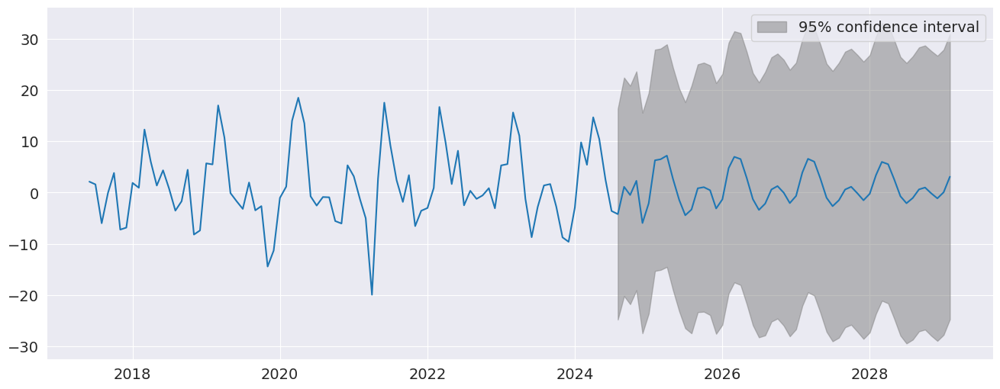

In [ ]:
mod = AutoReg(housing, 4, old_names=False)
res = mod.fit()

sel = ar_select_order(housing, 18, old_names=False)
sel.ar_lags
res = sel.model.fit()

fig = res.plot_predict(700, 840)


У наведеному вище сюжеті ми сформували прогноз на наступні сто місяців.

Наведений вище код використовує модель, яка фіксує останній «шаблон» сезонності, тобто той самий сегмент, що повторюється.

Візуалізація часових рядів є одним із найважливіших етапів обробки даних, що дозволяє експерту оцінити загальну картину та приблизно зрозуміти характер даних (стаціонарність, сезонність, циклічність тощо).

# Visualization

*Які проблеми можуть виникнути під час відтворення кількох часових рядів на одному графіку?*

Якщо кількість часових рядів, які ви хочете візуалізувати, не перевищує 5, тоді гарною ідеєю може бути створення одного графіка з ними, але коли їх більше 10, це може стати складним:

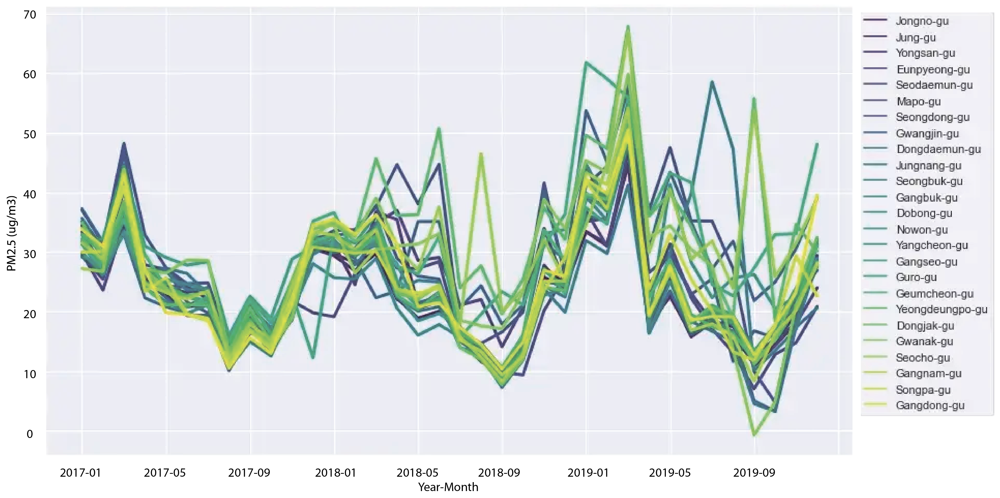

У наступних розділах ви дізнаєтеся, як візуалізувати велику кількість часових рядів таким чином, щоб вам, як експерту, було легше досліджувати дані:

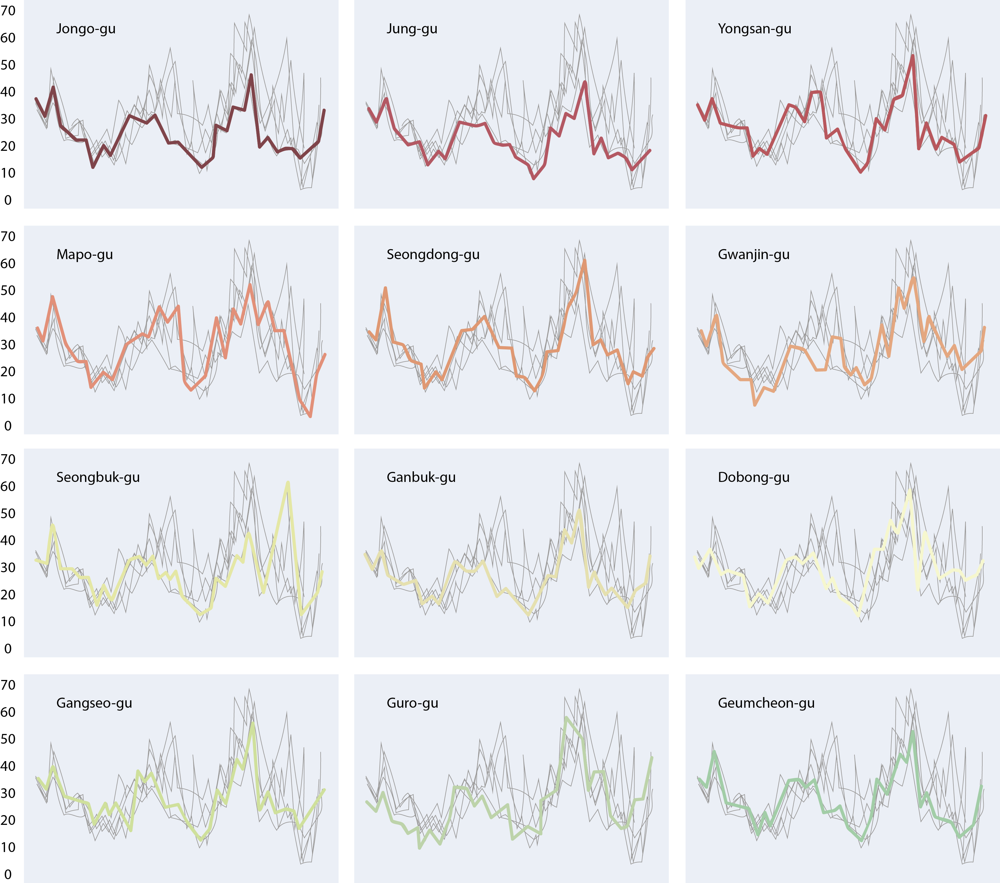

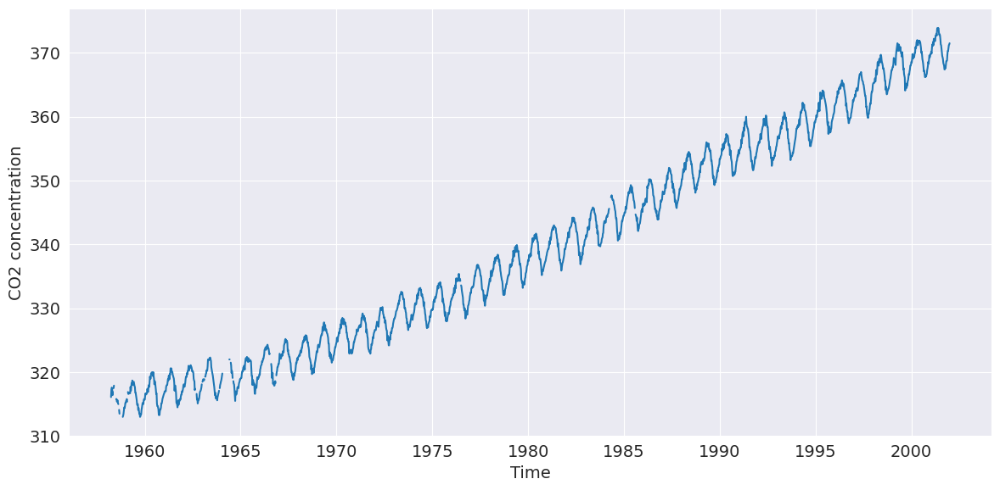

In [ ]:
# Loading libraries
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Reading data
data = sm.datasets.co2.load_pandas().data

# Creating Figure and Axes objects with specified sie
fig, ax = plt.subplots(figsize=(12, 6))

# Initialize the plot
ax.plot(data.index, data["co2"])

# Add axis labels
ax.set_xlabel("Time")
ax.set_ylabel("CO2 concentration")

# Adjust the padding between and around subplots, and display the plot
plt.tight_layout()
plt.show()

# Reading and Visualizing Data

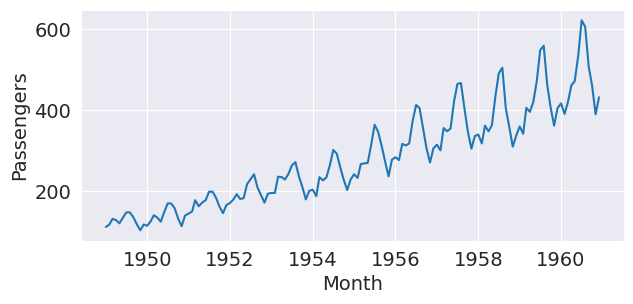

In [ ]:
# Loading libraries
import pandas as pd
import matplotlib.pyplot as plt

# Read dataset and transform data type
data = pd.read_csv("https://codefinity-content-media.s3.eu-west-1.amazonaws.com/943e906e-4de6-4694-a1df-313ceed7cfe7/AirPassengers.csv")
data["Month"] = pd.to_datetime(data["Month"])

# Creating Figure and Axes objects
fig, ax = plt.subplots(figsize=(7, 3))

# Initialize the plot
ax.plot(data["Month"], data["#Passengers"])

# Set axis labels
ax.set_xlabel("Month")
ax.set_ylabel("Passengers")

# Display the plot
plt.show()

# *Stationarity*

В аналізі часових рядів стаціонарність відноситься до особливості стохастичного процесу, коли статистичні властивості процесу не змінюються з часом. Середнє, дисперсія та структура автокореляції залишаються постійними.

Приклад стаціонарних даних:

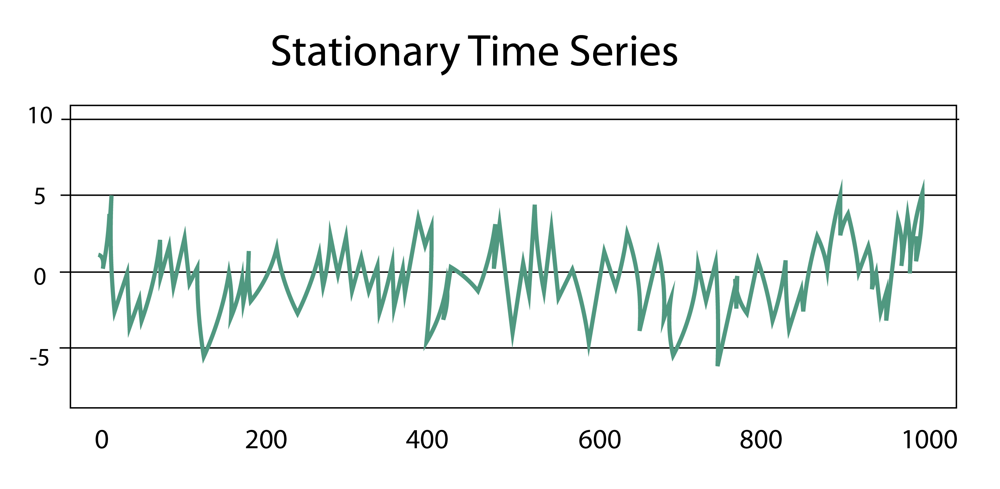

І нестаціонарні дані:

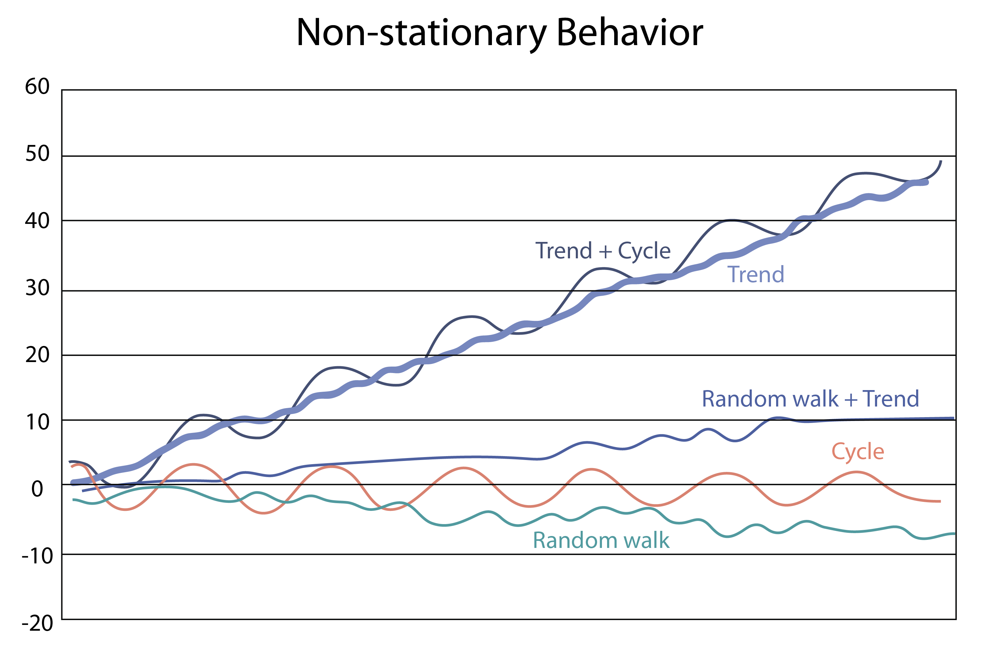

*Чому ця функція важлива для нас?*

Його наявність є критерієм у виборі моделей, які можна використовувати для прогнозування даних. Якщо дані стаціонарні, ви можете використовувати різні моделі (авторегресія, ковзне середнє, лінійна регресія тощо). З іншого боку, не існує універсальних моделей для прогнозування нестаціонарних процесів: деякі нестаціонарні часові ряди можна перетворити на стаціонарні за допомогою деяких математичних маніпуляцій (модель ARIMA); інші нестаціонарні часові ряди можна прогнозувати за допомогою спеціальних типів нейронних мереж.
Chomu tsya fun

Переходимо до перевірки даних на стаціонарність. Це можна зробити за допомогою статистичних тестів, які називаються «Тестами одиничного кореня».

*Існують такі тести, як:*

Розширений тест Дікі-Фуллера;

Квятковського-Філліпса-Шмідта-Шина;

Тест Philips Perron.

Найчастіше ми будемо використовувати розширений тест Дікі-Фуллера (ADF), але ви можете взяти до уваги результати інших тестів.

Використовуючи бібліотеку statsmodel, ми визначимо, чи є дані стаціонарними. Це робиться за допомогою кількох рядків коду:

In [ ]:
# from statsmodels.tsa.stattools import adfuller
# import pandas as pd

# dataset = pd.read_csv("time_series.csv", parse_dates=["date"])

# # ADF Test
# result = adfuller(dataset["Price"], autolag="AIC")
# print("ADF Statistic: %f" % (result[0]))
# print("p-value: %f" % (result[1]))

Як ми можемо інтерпретувати отримані результати?

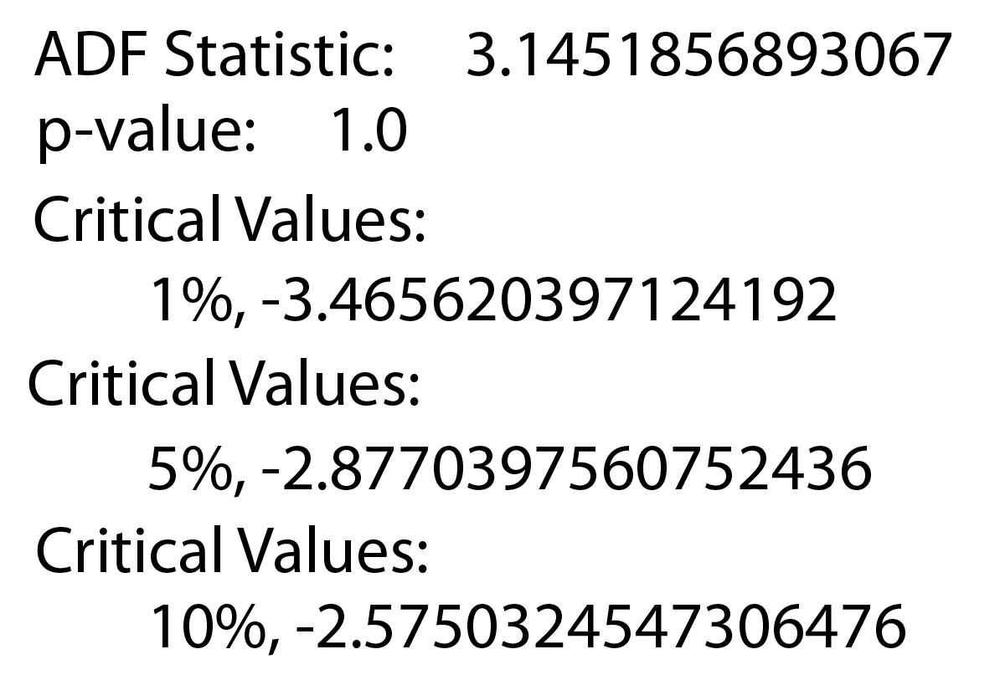

Нульова гіпотеза цього тесту полягає в тому, що часовий ряд є нестаціонарним. Якщо p-значення менше певного рівня (наприклад, 0,05), ми можемо відхилити нульову гіпотезу та зробити висновок, що часовий ряд є стаціонарним.

Давайте подивимося на значення p вище. Воно дорівнює 1,0, що означає, що ми не можемо відхилити нульову гіпотезу, і наші дані є нестаціонарними. Нульова гіпотеза була б хибною, якби p-значення було менше 0,05.

In [ ]:
# Importing libraries
from statsmodels.tsa.stattools import adfuller
import pandas as pd

# Reading data
data = pd.read_csv("https://codefinity-content-media.s3.eu-west-1.amazonaws.com/943e906e-4de6-4694-a1df-313ceed7cfe7/daily-total-female-births.csv")

# Create ADF test and print results
result = adfuller(data["Births"], autolag="AIC")

print("ADF Statistic: %f" % (result[0]))
print("p-value: %f" % (result[1]))

ADF Statistic: -4.808291
p-value: 0.000052


# Autocorrelation

Автокореляція вимірює, наскільки майбутні значення в часовому ряді лінійно залежать від минулих значень. Які приклади ми можемо навести?

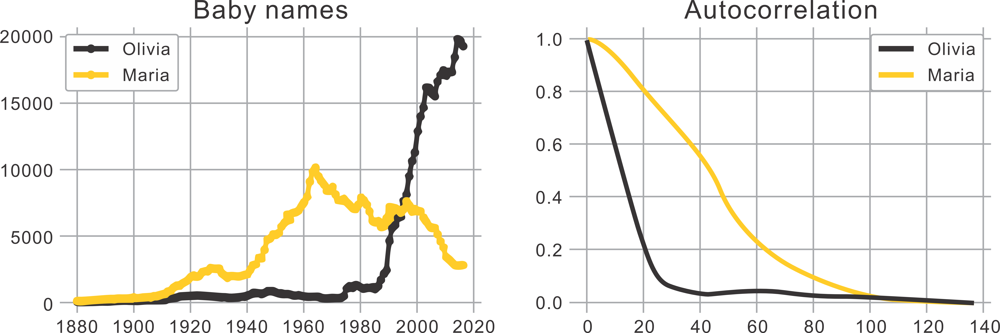

На графіку вище показано популярність імен «Марія» та «Олівія» за 140 років. Автокореляція Олівії слабшає набагато швидше, ніж автокореляція Марії: це можна пояснити тим, що популярність імені Олівія була дуже низькою до 1980 року, а потім дуже різко зросла. Тоді як популярність імені Марія не мала таких різких стрибків і з часом розвивалася приблизно однаково.

Let's visualize the autocorrelation:

In [ ]:
# import pandas as pd
# from statsmodels.graphics.tsaplots import plot_acf


# # Read dataset
# dataset = pd.read_csv("AirPassengers.csv",
#         header=0, index_col=0, parse_dates=True,
#         squeeze=True)


# # Plot the autocorrelation
# plot_acf(dataset, lags=22)

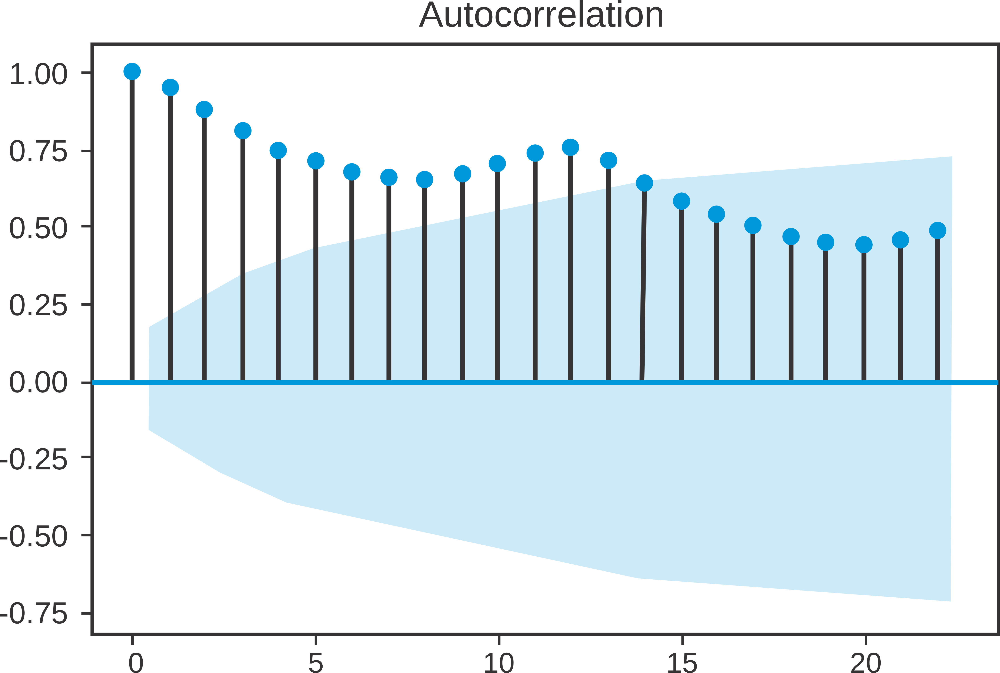


Давайте подивимося, як інтерпретувати цю діаграму. На графіку показано останні 22 значення з набору даних (вони показані вертикальними лініями). Якщо ці лінії потрапляють у заштриховану синю область, це означає, що вони не мають значної кореляції з попередніми значеннями.

Як ви можете бачити на графіку, перші 13 значень корелюють з попередніми, тоді як наступні ні.

Таким чином, автокореляція корисна для виявлення статистично значущих зв’язків між значеннями в часовому ряді.

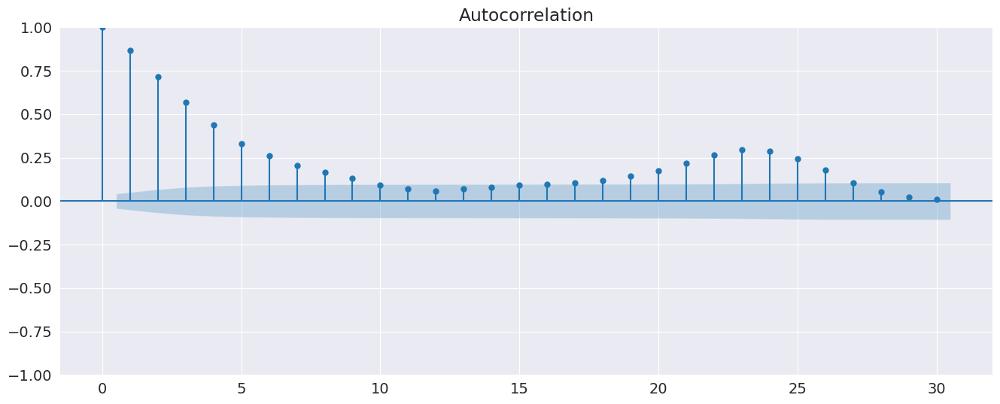

In [ ]:
# Importing libraries
import pandas as pd
from statsmodels.graphics.tsaplots import plot_acf

# Reading data
data = pd.read_csv("https://codefinity-content-media.s3.eu-west-1.amazonaws.com/943e906e-4de6-4694-a1df-313ceed7cfe7/air_quality_no2_long.csv")

# Visualize autocorrelation
plot_acf(data["value"], lags=30)

plt.show()

# Decomposition

Декомпозиція — це техніка аналізу часових рядів, яка дозволяє розкласти ряд на кілька компонентів: сезонність, шум і тренди.

Візьмемо як приклад розпродажі в супермаркетах.

Якщо говорити про сезонність, то продажі мають добову сезонність (кількість покупок збільшується ввечері та може бути меншою вранці), тижневу (більшість покупок здійснюється в п’ятницю та вихідні) та місячну (наприклад, більше покупок робиться). у святкові місяці: грудень, січень).

Давайте проллємо трохи світла на математичну модель методу декомпозиції:

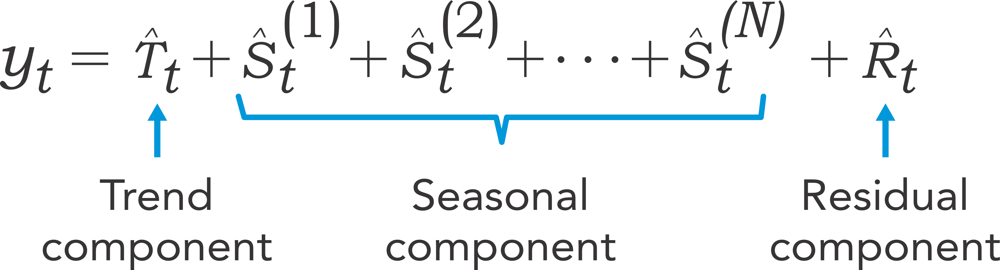

Як бачимо, за кожен параметр відповідають коефіцієнти T, S і R.

Основну різницю між трендом і сезонністю можна побачити нижче:

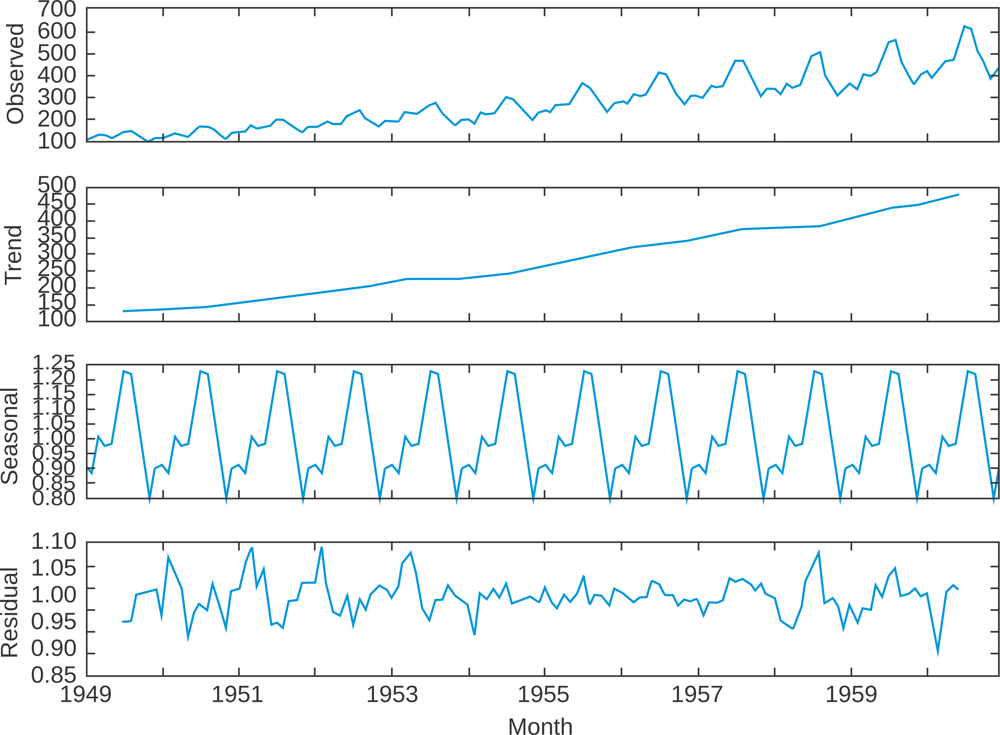

Тоді як тренд є загальним систематичним лінійним або нелінійним компонентом, сезонний компонент є повторюваним. Обидва ці типи компонентів можуть бути присутніми в часовому ряді одночасно.

Щоб запустити метод декомпозиції, ми будемо використовувати метод MSTL, що означає Multiple Seasonal-Trend decomposition using Loess. Імпорт statsmodel для виконання декомпозиції часових рядів:

In [ ]:
# from statsmodels.tsa.seasonal import MSTL


# stl_kwargs = {"seasonal_deg": 0}
# model = MSTL(data, periods=(24, 24 * 7), stl_kwargs=stl_kwargs)
# res = model.fit()

# seasonal = res.seasonal
# trend = res.trend
# residual = res.resid

# res.plot()

В результаті маємо наступне:

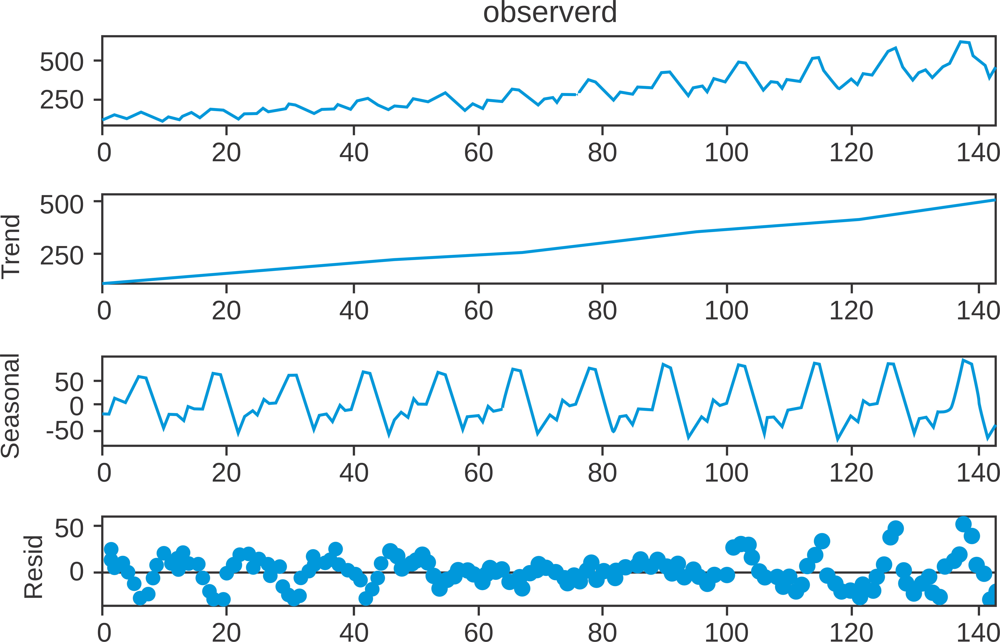

За допомогою цієї візуалізації ми вже можемо відстежувати загальний висхідний тренд і сезонність. У загальному випадку декомпозиція може допомогти нам перейти від аналізу нестаціонарного ряду до стаціонарного, виключаючи сезонну складову і тренд, ми можемо аналізувати ряд за допомогою залишків.

# Simple Time Series

Роль візуалізації в аналізі часових рядів вже була продемонстрована вам у попередньому розділі. Погляду експерта на діаграму може бути достатньо, щоб зрозуміти, стаціонарні дані чи ні, які основні закономірності в них присутні тощо.

Незважаючи на це, важливо пам’ятати, що оцінка експерта не є точною, і ми все ж рекомендуємо використовувати формальні методи (тести) для аналізу ваших даних.

Ви вже знаєте, як реалізувати 2D візуалізацію:

In [ ]:
# import matplotlib.pyplot as plt

# fig, ax = plt.subplots(figsize=(11, 9))
# ax.plot(dataset["Date"], dataset["NO2"])
# ax.set_xlabel("Date")
# ax.set_ylabel("NO2")
# plt.show()

Але давайте як приклад візьмемо ситуацію, коли нам потрібно взяти до уваги 2 або 3 змінні, які змінюються з часом. Наприклад, у вас є інтернет-магазин і завдання ціноутворення, для якого ви використовуєте дані про ціни конкурентів. Ви боретеся з 2 вашими головними конкурентами. Подивіться, як можна розмістити кілька часових рядів на одному графіку одночасно:

In [ ]:
# plt.figure(figsize=(11, 9))
# dataset.plot(label="dataset", color=["orange", "blue"])

# plt.ylabel("Price")
# plt.xlabel("Date")
# plt.legend()

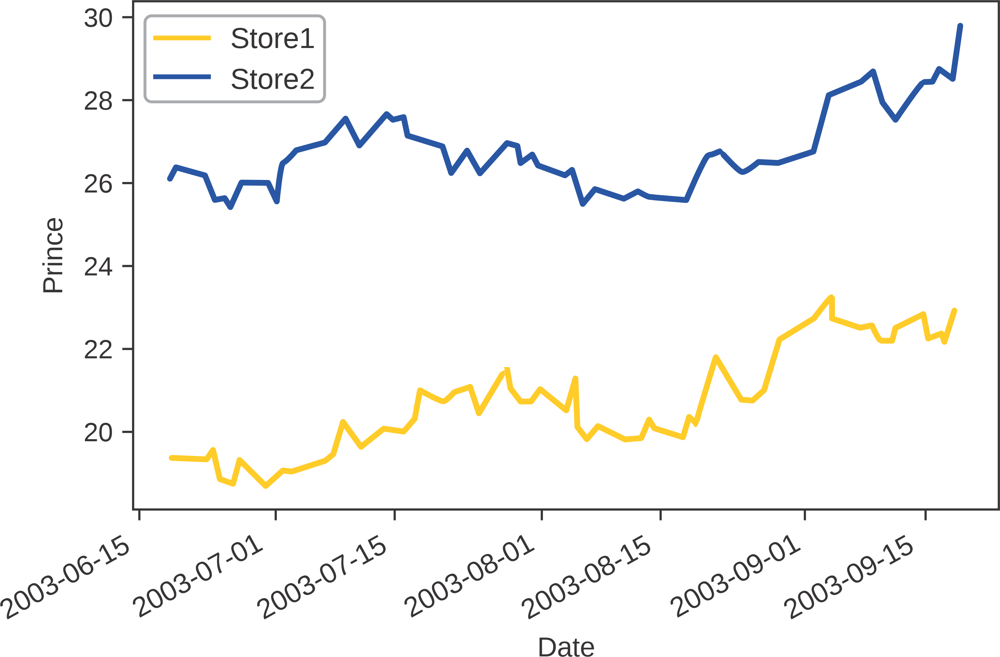

Як виглядають дані в наборі даних:

In [ ]:
# dataset.head()

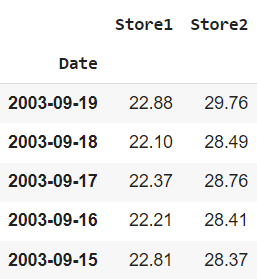

Крім того, ви можете реалізувати це таким чином через цикл:

In [ ]:
# date = pd.to_datetime(dataset.index)

# for i in dataset.columns:
#     plt.plot(date, dataset[i])

# plt.show()

Якщо у вас є великий обсяг даних (наприклад, ви хочете дослідити понад 20 конкурентів), у вас можуть виникнути проблеми з аналізом отриманого графіка:

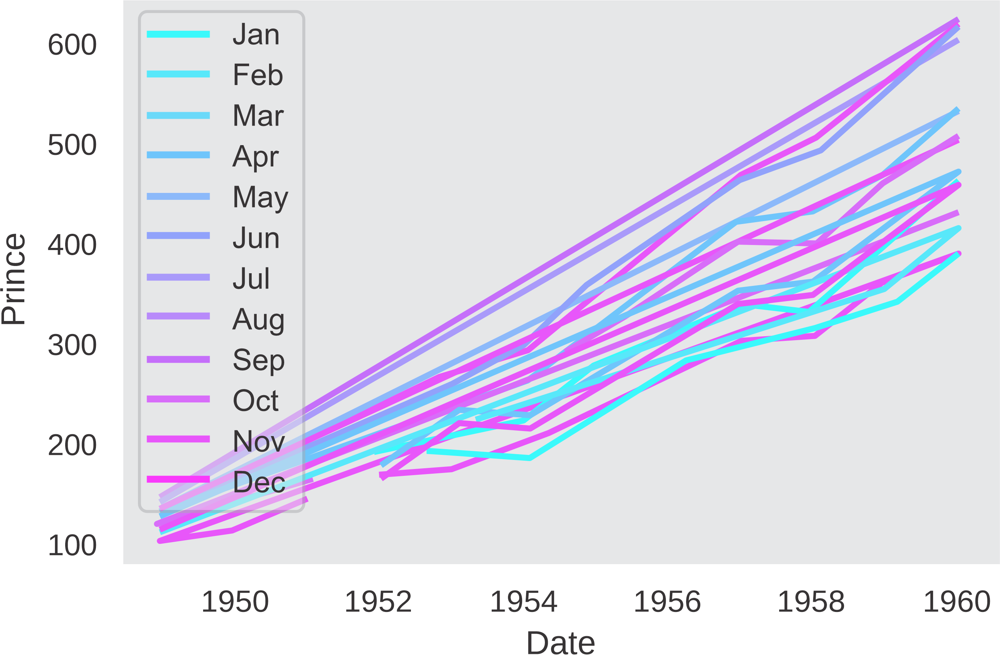

Потім ви можете використовувати бібліотеку seaborn, яка дозволяє порівнювати кілька графіків між собою:

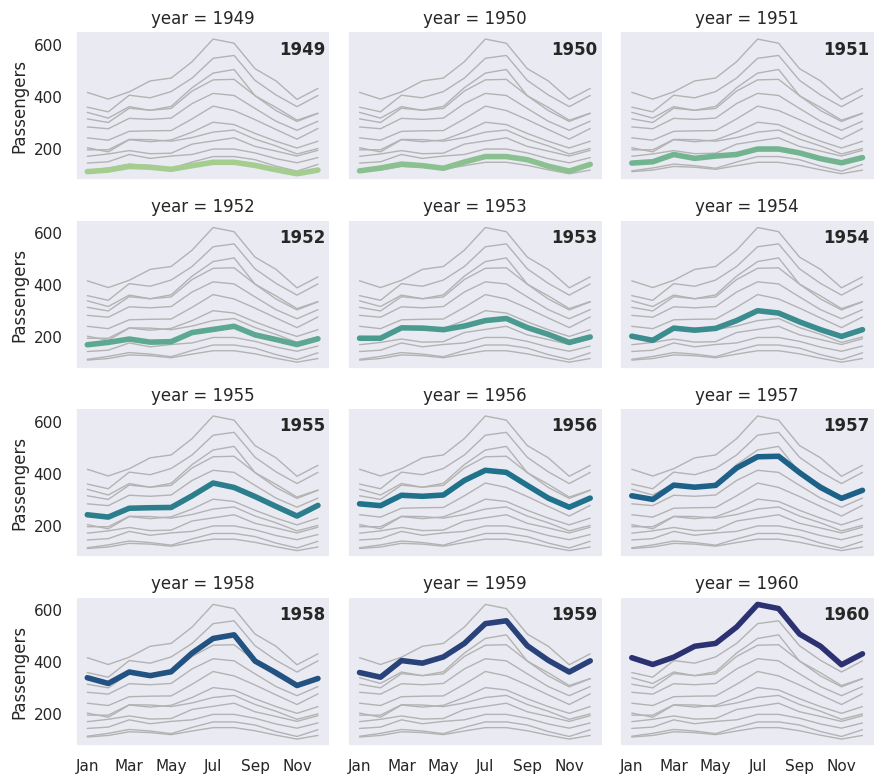

In [ ]:
import seaborn as sns

sns.set_theme(style="dark")
flights = sns.load_dataset("flights")

g = sns.relplot(
    data=flights,
    x="month", y="passengers", col="year", hue="year",
    kind="line", palette="crest", linewidth=4, zorder=5,
    col_wrap=3, height=2, aspect=1.5, legend=False,
)

for year, ax in g.axes_dict.items():
    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")
    sns.lineplot(
        data=flights, x="month", y="passengers", units="year",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

ax.set_xticks(ax.get_xticks()[::2])
g.set_axis_labels("", "Passengers")
g.tight_layout()

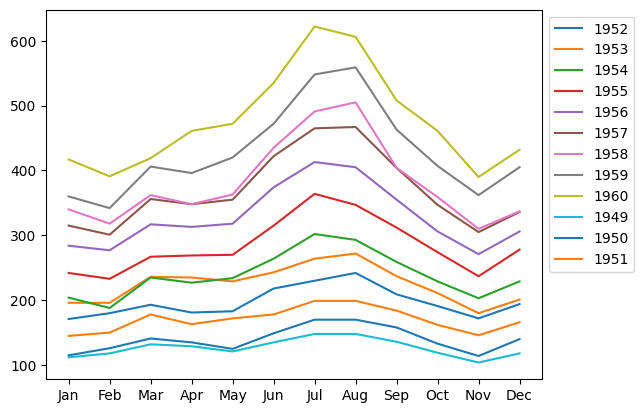

In [ ]:
# Importing libraries
import pandas as pd
import matplotlib.pyplot as plt

# Reading the data
df = pd.read_csv("https://codefinity-content-media.s3.eu-west-1.amazonaws.com/943e906e-4de6-4694-a1df-313ceed7cfe7/flights.csv", index_col = 0)

# Months labels
all_months = df.columns
n = 0 # Variable-counter

# Iterate over years
for year in df.index:
  	# Filter to specific year data
    year_row = df.iloc[n]
    # Initialize a line plot
    plt.plot(all_months, year_row, label=year)
    n += 1 # Increment variable n

# Display the legend and plot
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show()



# Customize Your Plot

Зараз ми розглянемо, як можна урізноманітнити та покращити представлення ваших графіків. Це покращить сприйняття графіка, а також може бути корисним при створенні презентацій та інших документів з аналізом даних.

Почнемо з додавання заголовків до графіка:

In [ ]:
# plt.figure(figsize=(11, 9))
# dataset.plot()
# plt.title("HH spot price")
# plt.show()

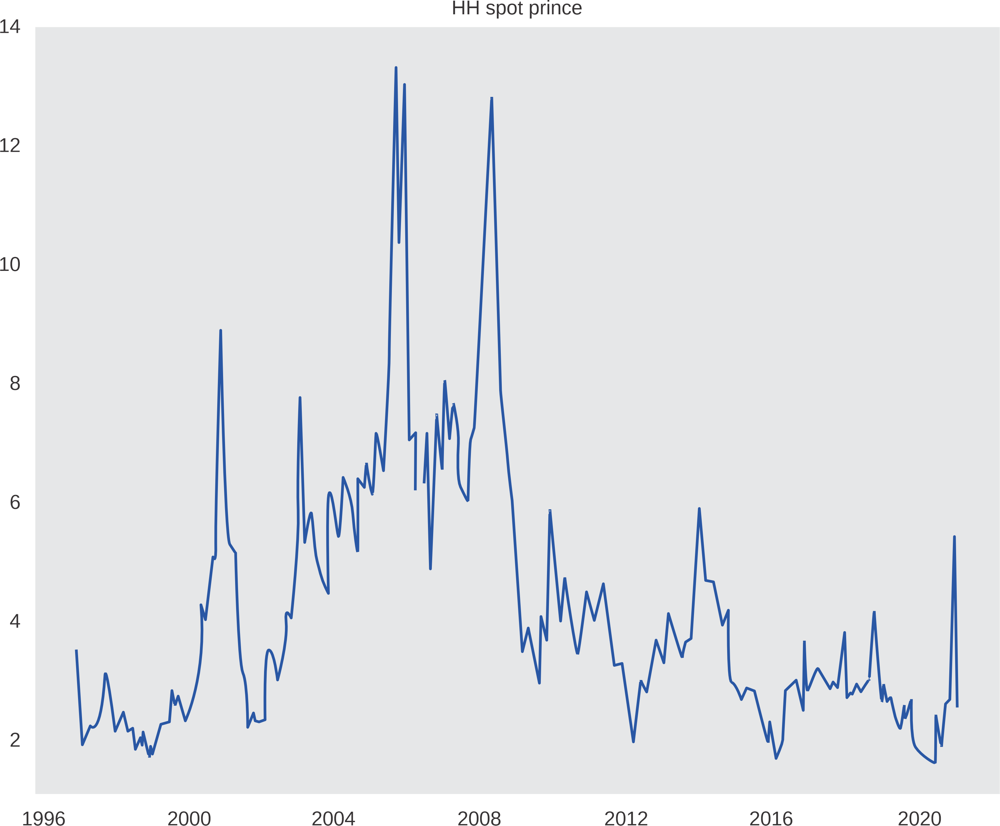

Ви також можете змінити стиль діаграми часових рядів. Якщо ви хочете, щоб графік був не суцільною лінією, а складався з крапок, тоді змініть значення аргументу linestyle на «пунктир»:

In [ ]:
# plt.figure(figsize=(11, 9))
# dataset.plot(linestyle="dotted")
# plt.title("HH spot price")
# plt.show()

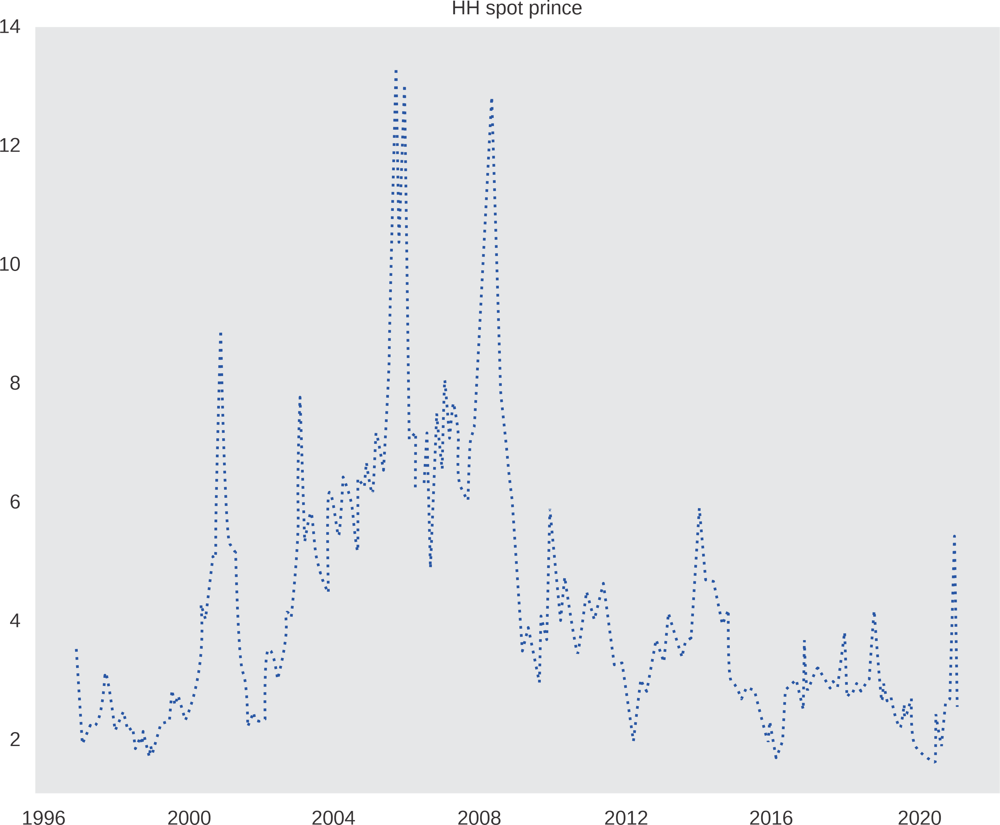

І нарешті, давайте розберемося, як змінити колірну схему діаграми. У вас є величезний вибір кольорових карт, повний список яких розміщено на офіційному веб-сайті matplotlib.

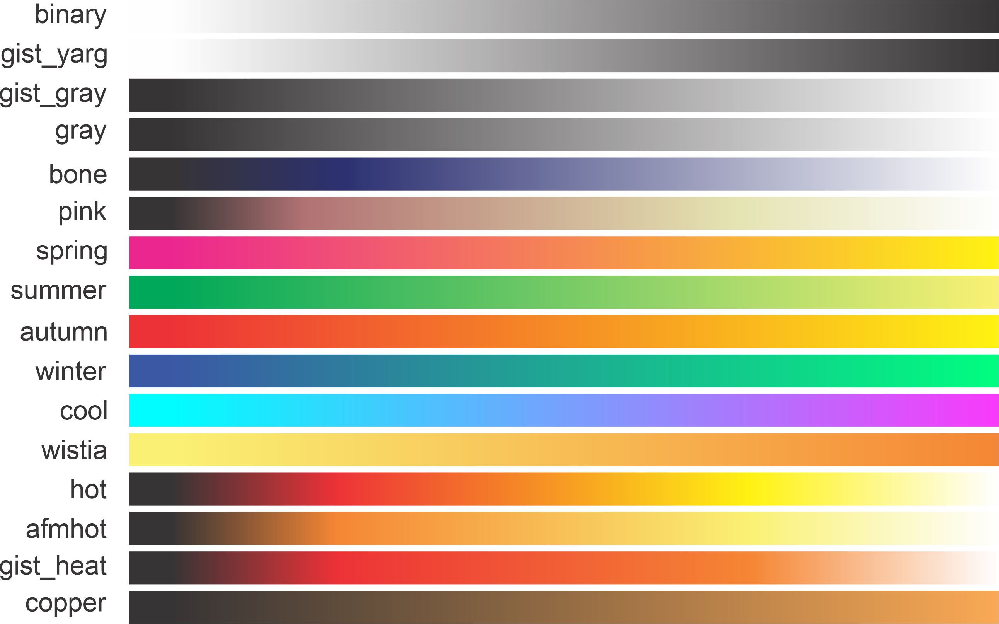

Щоб змінити палітру кольорів, вам просто потрібно змінити значення аргументу colormap на назву палітри, яка вас цікавить:

In [ ]:
# plt.figure(figsize=(11, 9))
# dataset.plot(label="dataset", colormap="cool")
# plt.ylabel("Price")
# plt.xlabel("Date")
# plt.legend()

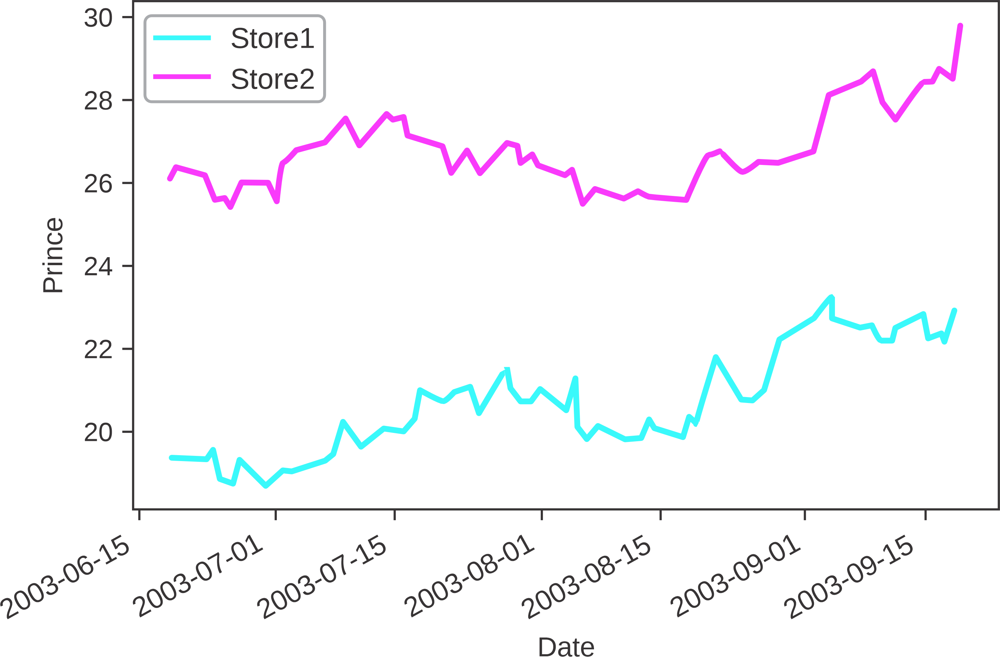

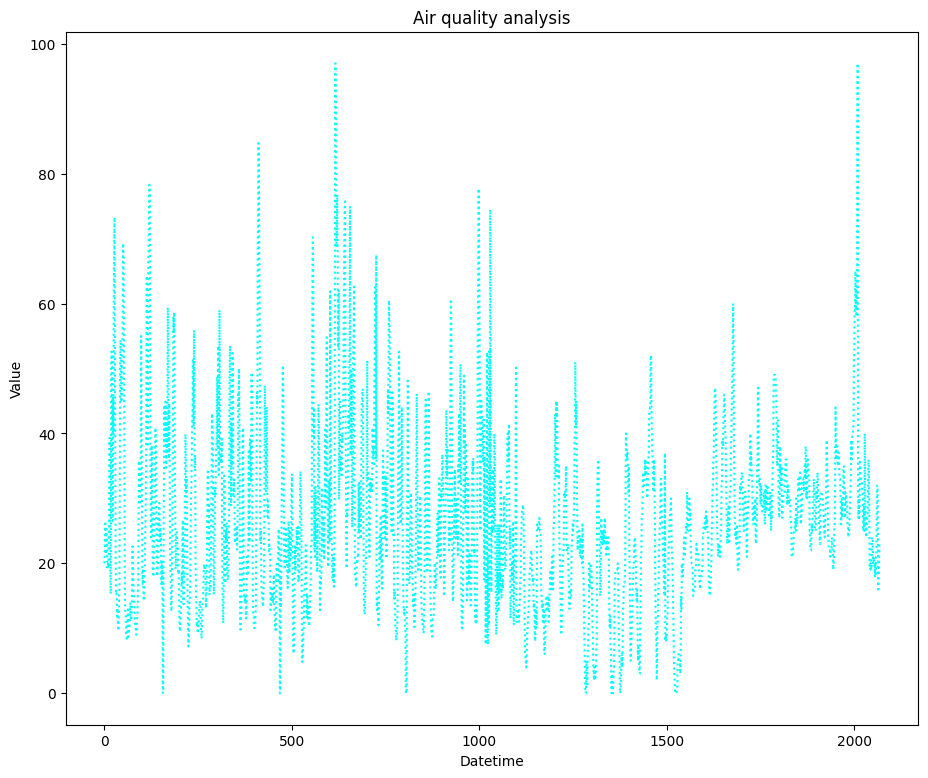

In [ ]:
# Importing libraries
import matplotlib.pyplot as plt
import pandas as pd

# Reading dataset
df = pd.read_csv("https://codefinity-content-media.s3.eu-west-1.amazonaws.com/943e906e-4de6-4694-a1df-313ceed7cfe7/pr_air_quality.csv")

# Visualizing dataset
plt.figure(figsize=(11, 9))
df["value"].plot(linestyle="dotted", colormap="cool")

# Add title and labels to plot
plt.title("Air quality analysis")
plt.xlabel("Datetime")
plt.ylabel("Value")

# Display the plot
plt.show()

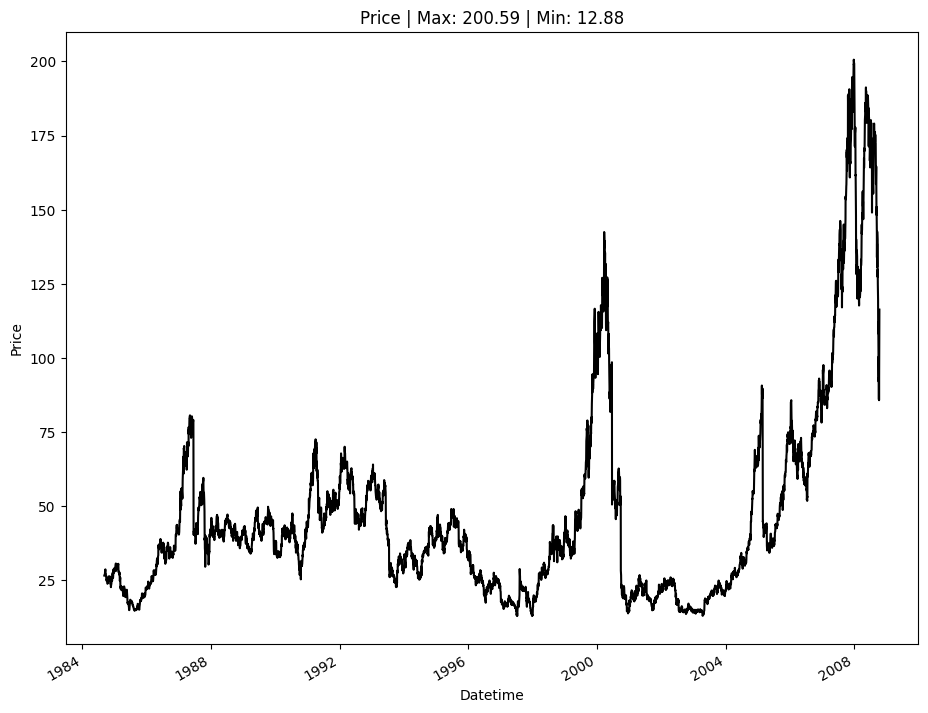

In [ ]:
# Importing libraries
import pandas as pd
import matplotlib.pyplot as plt

# Reading data
df = pd.read_csv("https://codefinity-content-media.s3.eu-west-1.amazonaws.com/943e906e-4de6-4694-a1df-313ceed7cfe7/aapl.csv")
df.index = pd.to_datetime(df["Date"])

# Initializing plot
plt.figure(figsize=(11, 9))
df["Open"].plot(colormap="gray")

# Setting plot title and labels
plt.title("Price | Max: %s | Min: %s" % (max(df["Open"]), min(df["Open"])))
plt.xlabel("Datetime")
plt.ylabel("Price")

# Displaying the plot
plt.show()

# Examples of Stationary Time Series

Давайте згадаємо основи. Що таке стаціонарні дані? Дані є стаціонарними, якщо їх статистичні властивості, такі як середнє значення, дисперсія та функція автокореляції, не залежать від часу.

Наприклад, процес білого шуму стаціонарний. Цей процес не має жодних тенденцій та інших шаблонів часових рядів, вибірки не корельовані одна з одною, а дисперсія дорівнює 1 для всіх вибірок.

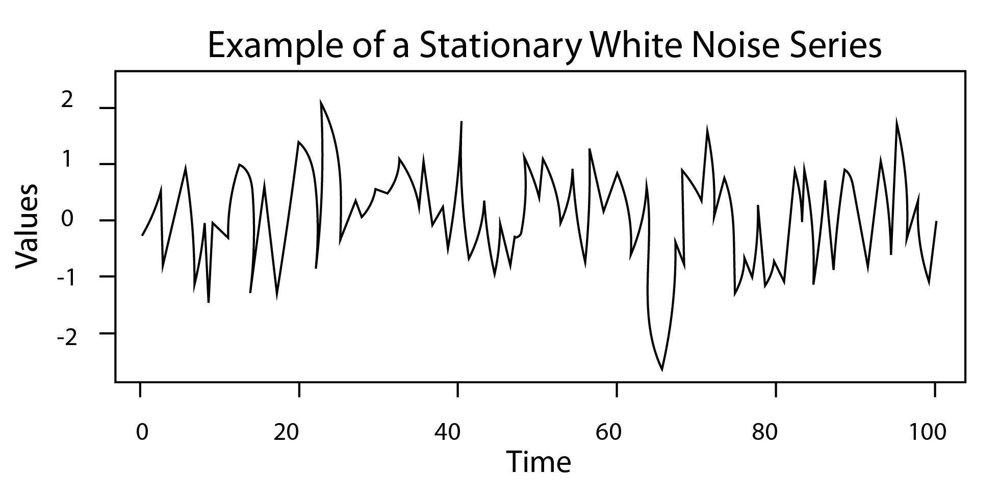

Немає певного типу даних, які завжди будуть нерухомими. Наприклад, не можна сказати, що покупки в інтернет-магазині обов'язково будуть стаціонарними (якраз навпаки, переважно нестаціонарними). Але якщо ми почнемо досліджувати статистику аварій протягом якогось короткого періоду, ми, швидше за все, виявимо, що ці дані стаціонарні, і немає видимої залежності один від одного.

Більшість часових рядів є нестаціонарними. Тому деякі методи дозволяють перетворювати дані в стаціонарні. У наступному розділі ви дізнаєтесь, як це реалізувати.

Чому дані повинні бути нерухомими? Тому що тільки стаціонарні дані містять характеристики, які необхідно враховувати при використанні найпопулярніших прогнозних моделей. Більш того, навіть просто з точки зору логіки, якщо дані не підкоряються якомусь певному закону і мають різні характеристики в різні моменти часу, то такі дані дуже важко передбачити

# *Simple Moving Average*

Математично модель простої ковзної середньої представлена ​​таким чином:

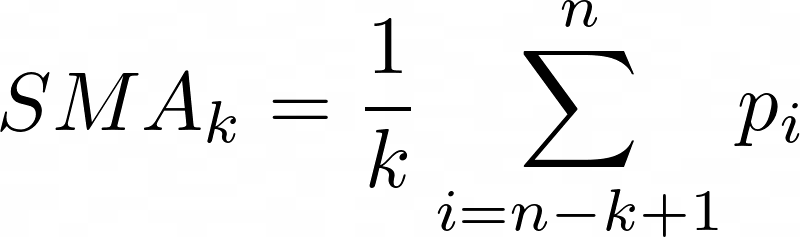

У цьому рівнянні SMA прогнозу складається зі змінних, де k — розмір вікна (скільки минулих значень ми візьмемо для обчислення наступного значення), а p — прийняте значення.

Як працює ця модель? Насправді просте ковзне середнє в кожен момент передбачення обчислює середнє кілька минулих значень - отримане число є наступним прогнозом. Можна уявити собі графік, по шляху якого рухається вікно розміром n (можна взяти 2 значення, можна взяти 3 і т. д.). Чим менше вікно, тим плавніші передбачення. Давайте продемонструємо це нижче:

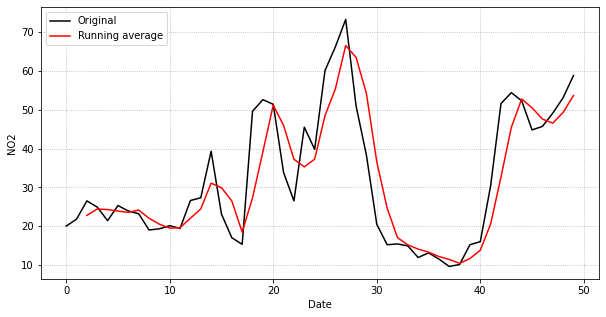

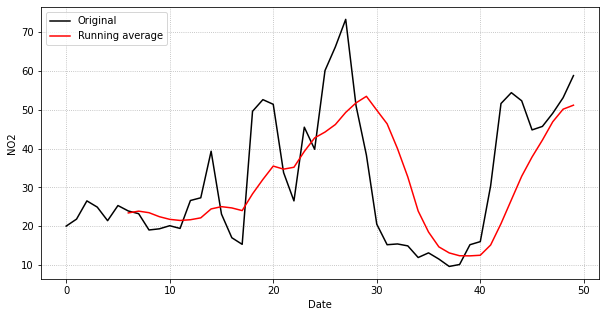

На першому зображенні розмір вікна, для якого обчислюється середнє значення, дорівнює 8, тоді як на другому графіку n = 3. Чим менше вікно, тим менше піків воно може охопити.

Python дозволяє реалізувати цю модель так:

In [ ]:
# import matplotlib.pyplot as plt
# import pandas as pd

# # Calculate predictions
# t_average = df["value"].rolling(window=8).mean()

# # Plot results
# plt.figure(figsize=(10, 5))
# plt.plot(df["value"][:50], "k-", label="Original")
# plt.plot(t_average[:50], "r-", label="Running average")
# plt.ylabel("NO2")
# plt.xlabel("Date")
# plt.grid(linestyle=":")
# plt.legend(loc="upper left")
# plt.show()



*rolling*() - функція, що використовується для обчислення ковзного середнього.

Проста ковзаюча середня є однією з найпростіших моделей, тому для її реалізації достатньо використовувати бібліотеку pandas.

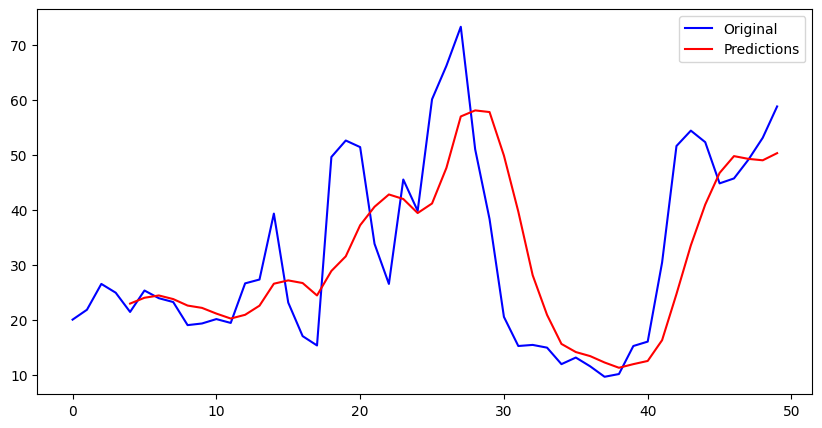

In [7]:
# Importing libraries
import pandas as pd
import matplotlib.pyplot as plt

# Reading dataset
df = pd.read_csv("https://codefinity-content-media.s3.eu-west-1.amazonaws.com/943e906e-4de6-4694-a1df-313ceed7cfe7/pr_air_quality.csv")

# Transform "date.utc" column to datetime
df["date.utc"] = pd.to_datetime(df["date.utc"])

# Create moving average model
pred = df["value"].rolling(window=5).mean()

# Visualize results
plt.figure(figsize=(10, 5))
plt.plot(df["value"][:50], "b-", label="Original")
plt.plot(pred[:50], "r-", label="Predictions")

# Adding legend and displaying the plot
plt.legend()
plt.show()

# *Autoregression*

Переходимо до розгляду авторегресійної моделі

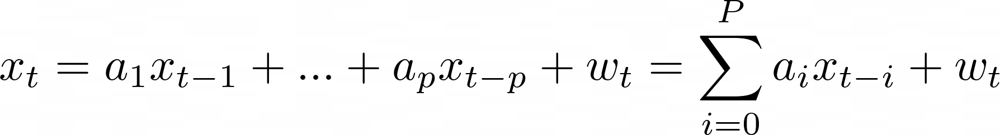

Формула схожа на формулу лінійної регресії, звідки й походить назва. Замість коефіцієнта - використовується минуле значення x.

За допомогою *statsmodels* ми можемо запустити авторегресійну модель *AutoReg*():

In [ ]:
# from statsmodels.tsa.ar_model import AutoReg


# # Train autoregression model
# model = AutoReg(df["value"], lags=3)
# model_fit = model.fit()


# # Make predictions
# predictions = model_fit.predict(start=0, end=len(X)-1, dynamic=False)


# # Plot results
# plt.plot(df["value"][:50])
# plt.plot(predictions[:50], color='red')
# plt.show()

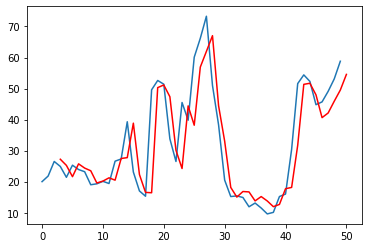

Якщо ви помітили, передбачення авторегресійної моделі точніші, ніж передбачення простої ковзної середньої.

Давайте навчимося оцінювати отримані результати навчених моделей. Похибка обчислюється за допомогою середньоквадратичної похибки. Це робиться просто за допомогою функцій *sqrt()* і *mean_squared_error()*:

In [ ]:
# from sklearn.metrics import mean_squared_error
# from math import sqrt

# test_score = sqrt(mean_squared_error(df["value"][3:], predictions
# [3:]))
# print("Test MSE: %.3f" % test_score)

Test MSE: 2.072

Таким же чином обчислюємо значення похибки для попередньої моделі:

Test MSE: 5.321


Чим менше значення MSE, тим відповідно менша помилка.

<ipython-input-10-4a806f17be9d>:12: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  df = pd.read_csv("https://codefinity-content-media.s3.eu-west-1.amazonaws.com/943e906e-4de6-4694-a1df-313ceed7cfe7/shampoo.csv",  parse_dates=[0], index_col=0, date_parser=parser)


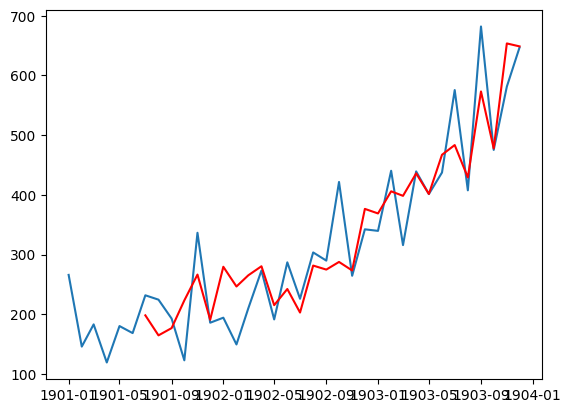

In [10]:
# Importing libraries
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.ar_model import AutoReg
from datetime import datetime

# Parser for the datetime
def parser(x):
  return datetime.strptime("190"+x, "%Y-%m")

# Reading dataset
df = pd.read_csv("https://codefinity-content-media.s3.eu-west-1.amazonaws.com/943e906e-4de6-4694-a1df-313ceed7cfe7/shampoo.csv",  parse_dates=[0], index_col=0, date_parser=parser)
df.index = pd.DatetimeIndex(df.index.values, freq=df.index.inferred_freq)

# Train autoregression with 6 lags
model = AutoReg(df["Sales"], lags=6)
model_fit = model.fit()

# Make predictions
predictions = model_fit.predict(start=0, end=len(df)-1, dynamic=False)

# Visualize the results
plt.plot(df["Sales"][:150])
plt.plot(predictions[:150], color="red")
plt.show()

# *Autoregressive-Integrated-Moving-Average Model*

Остання модель, яку ми розглянемо, це авторегресійна інтегрована ковзаюча середня. Ця модель поєднує авторегресію, ковзну середню та техніку диференціації (це не та модель, яку ми обговорювали вище). Він представлений таким чином:

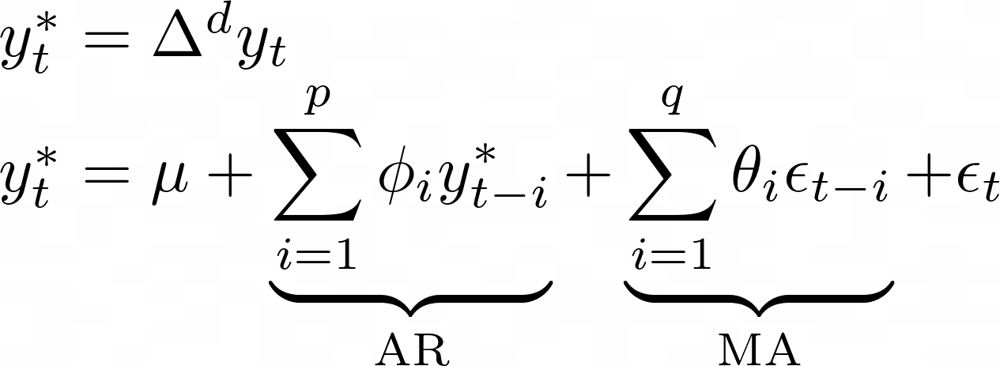

Це може виглядати досить складно, але насправді, дивіться, AR - це авторегресійна модель, з якою ви вже знайомі, MA - це ковзне середнє, яке має на увазі лінійну комбінацію помилок минулого прогнозу.

ARIMA використовує 3 параметри, які ми повинні вибрати самі (p, d, q):

*P* - називається порядком авторегресії. Це кількість безпосередньо попередніх значень у ряді, які використовуються для прогнозування значення в даний час;

*D* - порядок розрізнення;

*Q* - порядок ковзної середньої. Дозволяє встановити похибку моделі як лінійну комбінацію раніше спостережених значень похибок.

**Примітка**

У наступних розділах ми розглянемо методи розрізнення більш детально

У чому перевага цієї моделі? Він може прогнозувати прості нестаціонарні процеси (точніше, процеси, у яких середнє значення та коваріація змінюються з часом) і більш ефективний при роботі з короткостроковими прогнозами.

Давайте створимо для цього модель *ARIMA* за допомогою *statsmodels* і використаємо клас *ARIMA()*:

In [ ]:
# from statsmodels.tsa.arima.model import ARIMA
# from sklearn.metrics import mean_squared_error
# from math import sqrt

# X = df.values
# size = int(len(X) * 0.6)
# train, test = X[0:size], X[size:]
# history = train.tolist()
# predictions = list()

# # Making foreasts with ARIMA model
# for t in range(len(test)):
#   model = ARIMA(history, order=(5, 1, 0))
#   model_fit = model.fit()
#   output = model_fit.forecast()
#   predictions.append(output[0])
#   history.append(test[t])

# # Calculate MSE error
# rmse = sqrt(mean_squared_error(test, predictions))
# print("Test RMSE: %.3f" % rmse)

# # Plot results
# plt.plot(test)
# plt.plot(predictions, color="red")
# plt.show()

Результати:

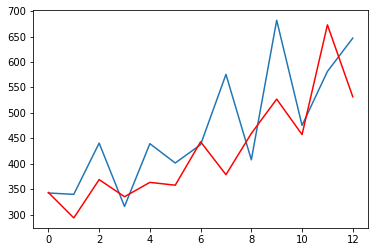

Загалом, ви будете використовувати 2 функції: .*forecast()* і *.predict()*. Перша функція призначена для передбачень поза набором даних (саме тому ми використовували цикл у прикладі вище), тоді як використовується функція *.predict()*. для передбачень всередині набору даних.

Крім того, ви можете експериментувати з параметрами p, q і d, щоб отримати найкращі результати. Але навіть за такими параметрами видно, що модель добре відстежує основні тренди.

Код може оброблятися до 1 хвилини